In [14]:
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from scipy.stats import pearsonr, spearmanr
import h3pandas
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pickle
from warnings import filterwarnings
import matplotlib.colors as colors
import geopandas as gpd 
import sys
import os
import seaborn as sns
import arviz as az

filterwarnings('ignore')
tqdm.pandas()

In [15]:
with open('../trophic_niches.txt','r') as f:
    niche_list = f.read().strip().split('\n')
    

In [16]:
beta_summary = []
beta_geographic_summary = []

niche = 'Trophic_Niche_Invertivore'

for var_ in ['delta_NDVI', 'tmin']:
    print(var_)
        
    idata_path = f'../../data/D06.BYM2_results_query_curve/{niche}_{var_}_sensitivity_year_effect.pkl'
    modeling_package_path = f'../../data/D06.BYM2_results_query_curve/modeling_package_{niche}_{var_}_sensitivity_year_effect.pkl'
    
    # Check data exists
    if not os.path.exists(idata_path):
        print(f'{niche} Not exists: {idata_path}')
        continue
    if not os.path.exists(modeling_package_path):
        print(f'{niche} Not exists: {modeling_package_path}')
        continue
    
    # Load data
    with open(modeling_package_path,'rb') as f:
        data, univ_cell, univ_pairs_adj_df = pickle.load(f)

    with open(idata_path,'rb') as f:
        idata = pickle.load(f)
        
    print((np.concatenate(idata.posterior['beta_year'].values, axis=0).mean(axis=0),
    np.concatenate(idata.posterior['beta_year'].values, axis=0).std(axis=0)))

    print(np.concatenate(idata.posterior['beta_temporal'].values, axis=0).mean(axis=0))
    
    print((np.concatenate(idata.posterior['mu_beta'].values, axis=0).mean(axis=0),
    np.concatenate(idata.posterior['mu_beta'].values, axis=0).std(axis=0)))



delta_NDVI
(-0.015878008634662363, 0.00849652373431303)
[-0.00955325  0.16491453  0.05403584  0.02562388  0.04506432 -0.02627813
  0.08039878 -0.10918576 -0.1381204  -0.02126597 -0.04661663]
(0.524203651094371, 0.029057195797935996)
tmin


(-0.005103489873881524, 0.010027768978359311)
[ 0.02904713  0.02800679  0.02202009 -0.04236721  0.08784039  0.00164604
  0.06474597 -0.08811581 -0.18151636 -0.00842048  0.09067649]
(0.738165305453065, 0.032740960640864694)


array([ 0.12245976,  0.20209923,  0.14744636, -0.03985336, -0.00416483,
       -0.14199451,  0.04776573, -0.07636819, -0.13454387, -0.08692008,
       -0.04204239])

In [17]:
only_niches_list = ['Trophic_Niche_Aquatic_predator',
 'Trophic_Niche_Frugivore',
 'Trophic_Niche_Granivore',
 'Trophic_Niche_Herbivore_aquatic',
 'Trophic_Niche_Herbivore_terrestrial',
 'Trophic_Niche_Invertivore',
 'Trophic_Niche_Nectarivore',
 'Trophic_Niche_Omnivore',
 'Trophic_Niche_Scavenger',
 'Trophic_Niche_Vertivore']

In [19]:
beta_summary = []
beta_geographic_summary = []

for niche in tqdm(niche_list):

    for var_ in ['delta_NDVI', 'mean_NDVI', 'tmax','tmean','tmin']:
        
        idata_path = f'../../data/D06.BYM2_results_query_curve/{niche}_{var_}_sensitivity_year_effect.pkl'
        modeling_package_path = f'../../data/D06.BYM2_results_query_curve/modeling_package_{niche}_{var_}_sensitivity_year_effect.pkl'
        
        # Check data exists
        if not os.path.exists(idata_path):
            print(f'{niche} Not exists: {idata_path}')
            continue
        if not os.path.exists(modeling_package_path):
            print(f'{niche} Not exists: {modeling_package_path}')
            continue
        
        # Load data
        with open(modeling_package_path,'rb') as f:
            data, univ_cell, univ_pairs_adj_df = pickle.load(f)

        with open(idata_path,'rb') as f:
            idata = pickle.load(f)
            
        # mu_beta: phenological sensitivity on geographical average
        mu_beta = np.concatenate(idata.posterior['mu_beta'].values, axis=0)
        mu_alpha = np.concatenate(idata.posterior['mu_alpha'].values, axis=0)
        
        # beta_lat: How phenological sensitivity change with latitude
        beta_lat = np.concatenate(idata.posterior['beta_lat'].values, axis=0)
        
        # beta_year
        beta_year = np.concatenate(idata.posterior['beta_year'].values, axis=0)

        beta_summary.append({
            'niche':niche,
            'env_var':var_,
            'season':'spring',
            'mu_beta_mean':np.mean(mu_beta), 
            'mu_beta_median':np.median(mu_beta),
            'mu_beta_std':np.std(mu_beta),
            'mu_beta_q025':np.quantile(mu_beta, 0.025),
            'mu_beta_q975':np.quantile(mu_beta, 0.975),
            'mu_alpha_mean':np.mean(mu_alpha), 
            'mu_alpha_median':np.median(mu_alpha), 
            'mu_alpha_std':np.std(mu_alpha),
            'mu_alpha_q025':np.quantile(mu_alpha, 0.025),
            'mu_alpha_q975':np.quantile(mu_alpha, 0.975),
            'beta_lat_mean':np.mean(beta_lat), 
            'beta_lat_median':np.median(beta_lat), 
            'beta_lat_std':np.std(beta_lat),
            'beta_lat_q025':np.quantile(beta_lat, 0.025),
            'beta_lat_q975':np.quantile(beta_lat, 0.975),
            'beta_year_mean':np.mean(beta_year), 
            'beta_year_median':np.median(beta_year), 
            'beta_year_std':np.std(beta_year),
            'beta_year_q025':np.quantile(beta_year, 0.025),
            'beta_year_q975':np.quantile(beta_year, 0.975)
        })
        
        # beta: phenological sensitivity considering all geographical variation
        beta = np.concatenate(idata.posterior['beta_spatial'].values, axis=0)
        beta_mean, beta_std = np.mean(beta, axis=0), np.std(beta, axis=0)
        
        # Drop convergence failed cells
        rhar_ = az.rhat(idata, var_names = ['beta_spatial'])
        ess_ = az.ess(idata, var_names = ['beta_spatial'])
        drop_index = set(list(np.where(rhar_['beta_spatial']>1.03)[0])) | set(list(np.where(ess_['beta_spatial']<400)[0]))
        
        beta_mean[list(drop_index)] = np.nan
        beta_std[list(drop_index)] = np.nan

        # 
        univ_cell = univ_cell.merge(
            data.groupby('h3_02').count()[['year']].reset_index(drop=False).rename(columns={'year':'year_data_count'}),
            on=['h3_02'], how='left'
        )
        univ_cell['beta_mean'] = beta_mean
        univ_cell['beta_std'] = beta_std
        univ_cell['year_data_count'] = univ_cell['year_data_count'].fillna(0)
        univ_cell['niche'] = niche
        univ_cell['env_var'] = var_
        univ_cell['season'] = 'spring'
        del univ_cell['geometry']
         
        beta_geographic_summary.append(univ_cell)
        
        data['env_date_mean'] = np.concatenate(
            idata.posterior['env_date'].values, axis=0
        ).mean(axis=0)
        data['env_date_mean'].iloc[list(drop_index)] = np.nan

        data['env_date_std'] = np.concatenate(
            idata.posterior['env_date'].values, axis=0
        ).std(axis=0)
        data['env_date_std'].iloc[list(drop_index)] = np.nan

        data['arrival_true_mean'] = np.concatenate(
            idata.posterior['arrival_true'].values, axis=0
        ).mean(axis=0)
        data['arrival_true_mean'].iloc[list(drop_index)] = np.nan

        data['arrival_true_std'] = np.concatenate(
            idata.posterior['arrival_true'].values, axis=0
        ).std(axis=0)
        data['arrival_true_std'].iloc[list(drop_index)] = np.nan
        
        data.to_csv(f'../../data/D07.BYM2_summary/modeling_data_with_posterior_est_niche_{niche}_env_{var_}_year_effect.csv', index=False)



  0%|          | 0/15 [00:00<?, ?it/s]

Trophic_Niche_Aquatic_predator Not exists: ../../data/D06.BYM2_results_query_curve/Trophic_Niche_Aquatic_predator_mean_NDVI_sensitivity_year_effect.pkl
Trophic_Niche_Aquatic_predator Not exists: ../../data/D06.BYM2_results_query_curve/Trophic_Niche_Aquatic_predator_tmax_sensitivity_year_effect.pkl
Trophic_Niche_Herbivore_terrestrial Not exists: ../../data/D06.BYM2_results_query_curve/Trophic_Niche_Herbivore_terrestrial_delta_NDVI_sensitivity_year_effect.pkl
Trophic_Niche_Herbivore_terrestrial Not exists: ../../data/D06.BYM2_results_query_curve/Trophic_Niche_Herbivore_terrestrial_mean_NDVI_sensitivity_year_effect.pkl
Trophic_Niche_Nectarivore Not exists: ../../data/D06.BYM2_results_query_curve/Trophic_Niche_Nectarivore_tmax_sensitivity_year_effect.pkl


In [20]:
beta_summary = pd.DataFrame(beta_summary)
beta_geographic_summary = pd.concat(beta_geographic_summary, axis=0).reset_index(drop=True)
beta_geographic_summary = beta_geographic_summary[beta_geographic_summary['dist']==1]
beta_summary.to_csv('../../data/D07.BYM2_summary/beta_summary_year_effect.csv', index=False)
beta_geographic_summary.to_csv('../../data/D07.BYM2_summary/beta_geographic_summary_year_effect.csv', index=False)


In [21]:
beta_summary = pd.read_csv('../../data/D07.BYM2_summary/beta_summary_year_effect.csv')
beta_geographic_summary = pd.read_csv('../../data/D07.BYM2_summary/beta_geographic_summary_year_effect.csv')


In [22]:
tmp = beta_summary[beta_summary['env_var'].isin(['delta_NDVI','tmin'])][['niche','env_var','beta_year_mean','mu_beta_mean']]
tmp1 = tmp[tmp['env_var']=='delta_NDVI']
del tmp1['env_var']
tmp1.columns = ['niche','beta_year_mean_for_delta_NDVI','mu_beta_mean_for_delta_NDVI']
tmp2 = tmp[tmp['env_var']=='tmin']
del tmp2['env_var']
tmp2.columns = ['niche','beta_year_mean_for_tmin','mu_beta_mean_for_tmin']

cor_df = pd.concat([tmp1.set_index('niche'), tmp2.set_index('niche')], axis=1)
cor_df = cor_df[cor_df.index.isin(only_niches_list)]
cor_df['beta_year_mean_for_delta_NDVI_relative'] = cor_df['beta_year_mean_for_delta_NDVI'] / cor_df['mu_beta_mean_for_delta_NDVI']
cor_df['beta_year_mean_for_tmin_relative'] = cor_df['beta_year_mean_for_tmin'] / cor_df['mu_beta_mean_for_tmin']
cor_df.corr()


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin,beta_year_mean_for_delta_NDVI_relative,beta_year_mean_for_tmin_relative
beta_year_mean_for_delta_NDVI,1.000000,0.033806,0.815793,-0.135895,0.961632,0.784917
mu_beta_mean_for_delta_NDVI,0.033806,1.000000,0.190950,0.945263,0.293721,0.335037
beta_year_mean_for_tmin,0.815793,0.190950,1.000000,-0.050524,0.806036,0.984121
mu_beta_mean_for_tmin,-0.135895,0.945263,-0.050524,1.000000,0.127492,0.105561
beta_year_mean_for_delta_NDVI_relative,0.961632,0.293721,0.806036,0.127492,1.000000,0.822639
beta_year_mean_for_tmin_relative,0.784917,0.335037,0.984121,0.105561,0.822639,1.000000


In [23]:
from scipy.stats import pearsonr
tmp = cor_df.dropna(subset=['beta_year_mean_for_delta_NDVI','mu_beta_mean_for_tmin'])
pearsonr(tmp['beta_year_mean_for_delta_NDVI'], tmp['mu_beta_mean_for_tmin'])

PearsonRResult(statistic=-0.1358948202057827, pvalue=0.7273824881712345)

In [24]:
from scipy.stats import pearsonr
tmp = cor_df.dropna(subset=['beta_year_mean_for_delta_NDVI','beta_year_mean_for_tmin'])
tmp = tmp[~tmp.index.isin(['all'])]
pearsonr(tmp['beta_year_mean_for_delta_NDVI'], tmp['beta_year_mean_for_tmin'])

PearsonRResult(statistic=0.8157933930511392, pvalue=0.007339282472014075)

In [27]:
from scipy.stats import ttest_rel
ttest_rel(tmp['beta_year_mean_for_delta_NDVI'], tmp['beta_year_mean_for_tmin'])


TtestResult(statistic=-3.5022171483431537, pvalue=0.008052873802563112, df=8)

In [26]:
tmp


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin,beta_year_mean_for_delta_NDVI_relative,beta_year_mean_for_tmin_relative
niche,,,,,,
Trophic_Niche_Aquatic_predator,-0.021152,0.489864,-0.017645,0.681650,-0.043179,-0.025885
Trophic_Niche_Frugivore,-0.014953,0.691019,-0.006966,0.922204,-0.021639,-0.007554
Trophic_Niche_Granivore,-0.018325,0.631133,-0.012389,0.876978,-0.029036,-0.014126
Trophic_Niche_Herbivore_aquatic,-0.005509,0.543260,-0.008484,0.744698,-0.010140,-0.011392
Trophic_Niche_Invertivore,-0.015878,0.524204,-0.005103,0.738165,-0.030290,-0.006914
Trophic_Niche_Nectarivore,-0.010959,0.612354,-0.002017,0.823395,-0.017896,-0.002450
Trophic_Niche_Omnivore,-0.026408,0.587281,-0.025433,0.867031,-0.044966,-0.029334
Trophic_Niche_Scavenger,-0.021403,0.588975,-0.015935,0.784200,-0.036340,-0.020320
Trophic_Niche_Vertivore,-0.019202,0.598226,-0.015473,0.815674,-0.032099,-0.018969


In [5]:
cor_df


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin,beta_year_mean_for_delta_NDVI_relative,beta_year_mean_for_tmin_relative
niche,,,,,,
all,-0.025559,0.612722,-0.016750,0.891363,-0.041714,-0.018791
Trophic_Niche_Aquatic_predator,-0.021152,0.489864,-0.017645,0.681650,-0.043179,-0.025885
Trophic_Niche_Frugivore,-0.014953,0.691019,-0.006966,0.922204,-0.021639,-0.007554
Trophic_Niche_Granivore,-0.018325,0.631133,-0.012389,0.876978,-0.029036,-0.014126
Trophic_Niche_Herbivore_aquatic,-0.005509,0.543260,-0.008484,0.744698,-0.010140,-0.011392
Trophic_Niche_Invertivore,-0.015878,0.524204,-0.005103,0.738165,-0.030290,-0.006914
Trophic_Niche_Omnivore,-0.026408,0.587281,-0.025433,0.867031,-0.044966,-0.029334
Trophic_Niche_Scavenger,-0.021403,0.588975,-0.015935,0.784200,-0.036340,-0.020320
Trophic_Niche_Vertivore,-0.019202,0.598226,-0.015473,0.815674,-0.032099,-0.018969


In [29]:
cor_df.corr(method='spearman')


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin,beta_year_mean_for_delta_NDVI_relative,beta_year_mean_for_tmin_relative
beta_year_mean_for_delta_NDVI,1.000000,0.230769,0.923077,-0.104396,0.917582,0.846154
mu_beta_mean_for_delta_NDVI,0.230769,1.000000,0.373626,0.829670,0.521978,0.445055
beta_year_mean_for_tmin,0.923077,0.373626,1.000000,0.017857,0.923077,0.982143
mu_beta_mean_for_tmin,-0.104396,0.829670,0.017857,1.000000,0.192308,0.132143
beta_year_mean_for_delta_NDVI_relative,0.917582,0.521978,0.923077,0.192308,1.000000,0.906593
beta_year_mean_for_tmin_relative,0.846154,0.445055,0.982143,0.132143,0.906593,1.000000


In [6]:
cor_df.sort_values('beta_year_mean_for_delta_NDVI')


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin,beta_year_mean_for_delta_NDVI_relative,beta_year_mean_for_tmin_relative
niche,,,,,,
Trophic_Niche_Omnivore,-0.026408,0.587281,-0.025433,0.867031,-0.044966,-0.029334
all,-0.025559,0.612722,-0.016750,0.891363,-0.041714,-0.018791
Trophic_Level_Omnivore,-0.025285,0.583417,-0.017781,0.822946,-0.043340,-0.021607
Trophic_Level_Carnivore,-0.023720,0.488875,-0.022089,0.711573,-0.048519,-0.031042
Trophic_Niche_Scavenger,-0.021403,0.588975,-0.015935,0.784200,-0.036340,-0.020320
Trophic_Niche_Aquatic_predator,-0.021152,0.489864,-0.017645,0.681650,-0.043179,-0.025885
Trophic_Niche_Vertivore,-0.019202,0.598226,-0.015473,0.815674,-0.032099,-0.018969
Trophic_Level_Herbivore,-0.019031,0.605556,-0.011240,0.847019,-0.031427,-0.013270
Trophic_Niche_Granivore,-0.018325,0.631133,-0.012389,0.876978,-0.029036,-0.014126


In [43]:
cor_df.sort_values(by='beta_year_mean_for_delta_NDVI')


,beta_year_mean_for_delta_NDVI,mu_beta_mean_for_delta_NDVI,beta_year_mean_for_tmin,mu_beta_mean_for_tmin
niche,,,,
Trophic_Niche_Omnivore,-0.026408,0.587281,-0.025433,0.867031
all,-0.025559,0.612722,-0.016750,0.891363
Trophic_Niche_Scavenger,-0.021403,0.588975,NaN,NaN
Trophic_Niche_Aquatic_predator,-0.021152,0.489864,-0.017645,0.681650
Trophic_Niche_Granivore,-0.018325,0.631133,-0.012389,0.876978
Trophic_Level_Scavenger,-0.016677,0.613042,-0.009658,0.804811
Trophic_Niche_Frugivore,-0.014953,0.691019,-0.006966,0.922204
Trophic_Niche_Herbivore_terrestrial,NaN,NaN,-0.002580,0.779297
Trophic_Niche_Invertivore,NaN,NaN,-0.005103,0.738165


In [31]:
beta_summary[beta_summary['env_var']=='delta_NDVI']['beta_year_mean']


0    -0.025559
5    -0.021152
7    -0.014953
11   -0.018325
26   -0.026408
28   -0.021403
34   -0.016677
Name: beta_year_mean, dtype: float64

In [32]:
beta_summary[beta_summary['env_var']=='tmin']['beta_year_mean']

4    -0.016750
6    -0.017645
10   -0.006966
14   -0.012389
20   -0.002580
23   -0.005103
25   -0.002017
27   -0.025433
36   -0.009658
Name: beta_year_mean, dtype: float64

In [29]:
beta_summary


,niche,env_var,season,mu_beta_mean,mu_beta_median,mu_beta_std,mu_beta_q025,mu_beta_q975,mu_alpha_mean,mu_alpha_median,...,beta_lat_mean,beta_lat_median,beta_lat_std,beta_lat_q025,beta_lat_q975,beta_year_mean,beta_year_median,beta_year_std,beta_year_q025,beta_year_q975
0,all,delta_NDVI,spring,0.612722,0.612784,0.030703,0.551261,0.674213,0.967642,0.968901,...,-0.002583,-0.002582,0.000650,-0.003868,-0.001312,-0.025559,-0.025494,0.009361,-0.044790,-0.007157
1,all,mean_NDVI,spring,0.577736,0.577676,0.025450,0.528183,0.628524,0.826128,0.825687,...,-0.001312,-0.001314,0.000684,-0.002653,0.000006,-0.018768,-0.018619,0.007472,-0.033925,-0.004143
2,all,tmax,spring,0.893559,0.893794,0.031918,0.828707,0.954959,1.555327,1.554227,...,-0.004751,-0.004755,0.000645,-0.006006,-0.003491,-0.015302,-0.015265,0.010036,-0.035240,0.004547
3,all,tmean,spring,0.888201,0.887593,0.030126,0.829825,0.949081,1.562918,1.562018,...,-0.004170,-0.004171,0.000633,-0.005411,-0.002963,-0.020212,-0.020050,0.009340,-0.038960,-0.002333
4,all,tmin,spring,0.891363,0.891071,0.028555,0.835117,0.948664,1.417135,1.416034,...,-0.003586,-0.003582,0.000579,-0.004719,-0.002455,-0.016750,-0.016609,0.008613,-0.033624,0.000401
5,Trophic_Niche_Aquatic_predator,delta_NDVI,spring,0.489864,0.489986,0.026105,0.436564,0.540001,0.690720,0.690518,...,-0.004277,-0.004278,0.000840,-0.005929,-0.002643,-0.021152,-0.021145,0.007599,-0.036388,-0.005948
6,Trophic_Niche_Aquatic_predator,tmin,spring,0.681650,0.682053,0.037244,0.607002,0.754665,1.093674,1.092680,...,-0.006426,-0.006420,0.000776,-0.007971,-0.004924,-0.017645,-0.017451,0.011184,-0.040309,0.004013
7,Trophic_Niche_Frugivore,delta_NDVI,spring,0.691019,0.691028,0.020374,0.650718,0.731804,0.078387,0.077724,...,-0.001594,-0.001596,0.000672,-0.002901,-0.000287,-0.014953,-0.014961,0.005920,-0.026962,-0.003015
8,Trophic_Niche_Frugivore,tmax,spring,0.917020,0.917176,0.026507,0.864009,0.968975,0.238220,0.238036,...,-0.003587,-0.003593,0.000753,-0.005053,-0.002098,-0.011229,-0.011217,0.007994,-0.026949,0.005017
9,Trophic_Niche_Frugivore,tmean,spring,0.908751,0.909043,0.027331,0.855214,0.963142,0.423059,0.423710,...,-0.003158,-0.003163,0.000760,-0.004646,-0.001669,-0.011269,-0.011192,0.008124,-0.027689,0.004733


In [4]:
beta_summary = pd.read_csv('../../data/D07.BYM2_summary/beta_summary_year_effect.csv')
beta_geographic_summary = pd.read_csv('../../data/D07.BYM2_summary/beta_geographic_summary_year_effect.csv')


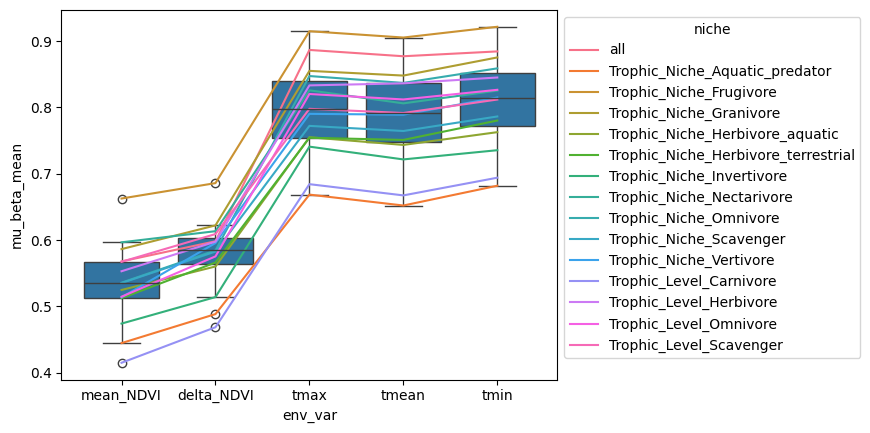

In [4]:
# Draw a nested boxplot to show bills by day and time
sns.boxplot(x="env_var", y="mu_beta_mean",
            #hue="niche",# palette=["m", "g"],
            data=beta_summary)
ax = sns.lineplot(x='env_var',
             y='mu_beta_mean',
             data=beta_summary,
             hue='niche')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


In [5]:
beta_summary

,niche,env_var,season,mu_beta_mean,mu_beta_std,mu_beta_q025,mu_beta_q975,mu_alpha_mean,mu_alpha_std,mu_alpha_q025,mu_alpha_q975,beta_lat_mean,beta_lat_std,beta_lat_q025,beta_lat_q975
0,all,mean_NDVI,spring,0.567871,0.011537,0.545078,0.590359,0.740144,0.137448,0.470686,1.011548,-0.001549,0.000686,-0.002889,-0.000198
1,all,delta_NDVI,spring,0.598235,0.011021,0.576515,0.619711,0.718009,0.134768,0.453491,0.976946,-0.002959,0.000653,-0.004231,-0.001683
2,all,tmax,spring,0.886800,0.011999,0.863588,0.910901,1.551772,0.127509,1.305060,1.802108,-0.004583,0.000652,-0.005903,-0.003306
3,all,tmean,spring,0.877291,0.011892,0.853820,0.900523,1.455770,0.124583,1.210183,1.699274,-0.004251,0.000660,-0.005522,-0.002917
4,all,tmin,spring,0.884582,0.011048,0.862759,0.906149,1.314695,0.123526,1.077252,1.559284,-0.003759,0.000580,-0.004875,-0.002632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,Trophic_Level_Scavenger,mean_NDVI,spring,0.567259,0.014078,0.539473,0.594821,-0.693766,0.178302,-1.047160,-0.347593,0.000895,0.000831,-0.000729,0.002548
71,Trophic_Level_Scavenger,delta_NDVI,spring,0.609113,0.013700,0.582175,0.636185,-0.367298,0.175871,-0.716606,-0.031144,-0.000588,0.000802,-0.002180,0.000991
72,Trophic_Level_Scavenger,tmax,spring,0.797999,0.016261,0.765487,0.828860,0.119486,0.172985,-0.213932,0.457960,-0.002621,0.000865,-0.004316,-0.000962
73,Trophic_Level_Scavenger,tmean,spring,0.791683,0.016226,0.759867,0.823001,0.180818,0.174543,-0.160966,0.516246,-0.002095,0.000864,-0.003759,-0.000388


<Axes: xlabel='env_var', ylabel='beta_lat_mean'>

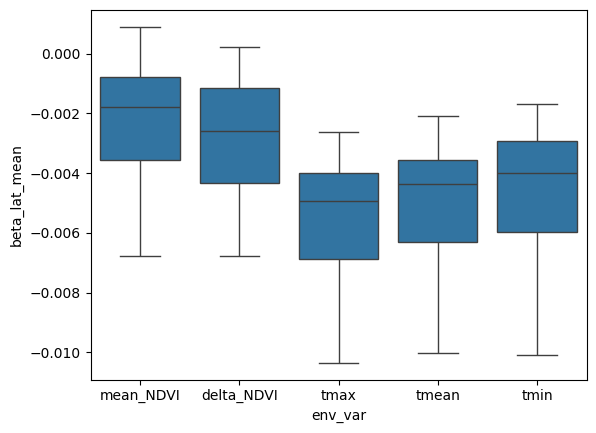

In [7]:
# Draw a nested boxplot to show bills by day and time
sns.boxplot(x="env_var", y="beta_lat_mean",
            #hue="niche",# palette=["m", "g"],
            data=beta_summary)


  0%|          | 0/5 [00:00<?, ?it/s]

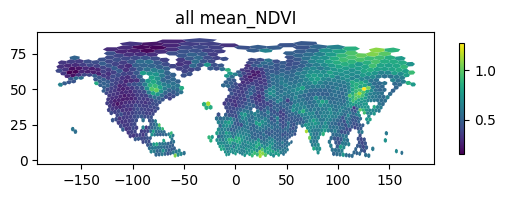

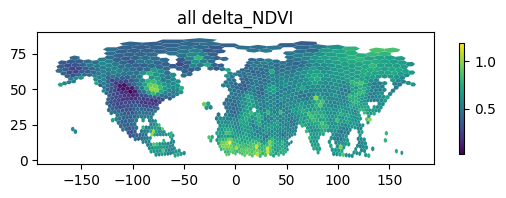

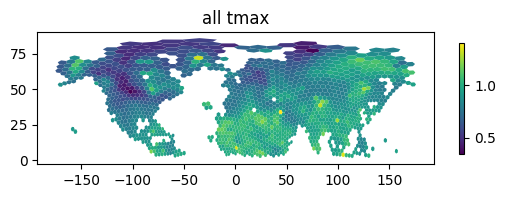

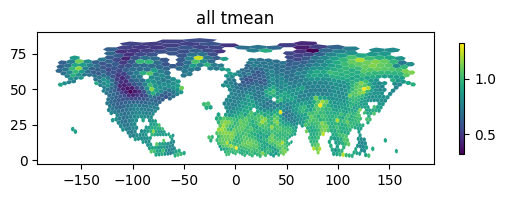

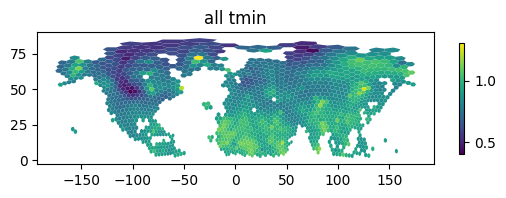

  0%|          | 0/5 [00:00<?, ?it/s]

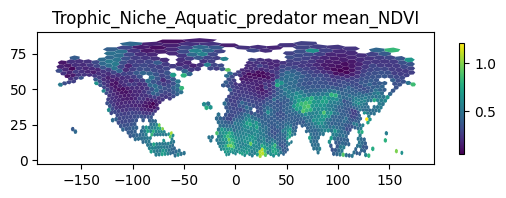

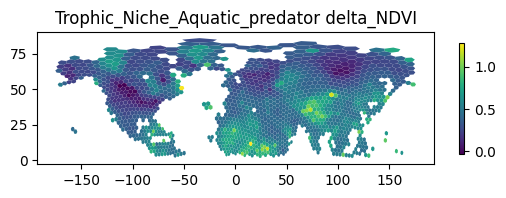

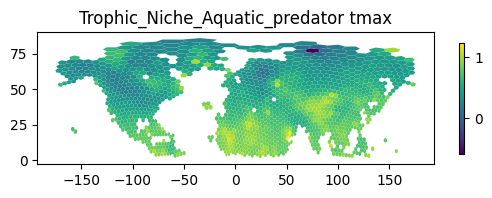

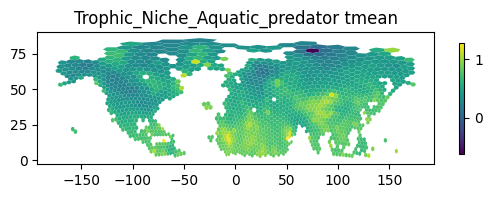

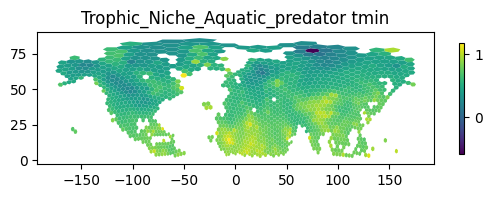

  0%|          | 0/5 [00:00<?, ?it/s]

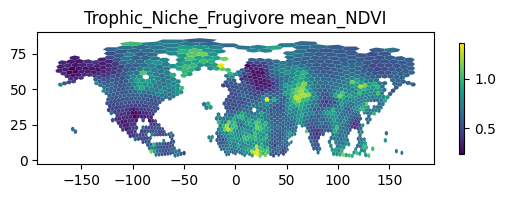

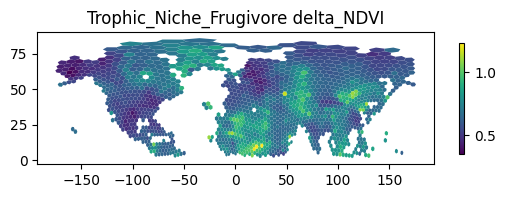

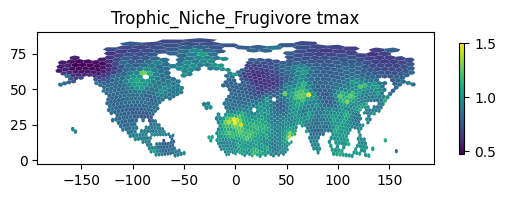

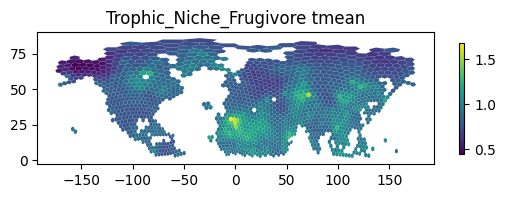

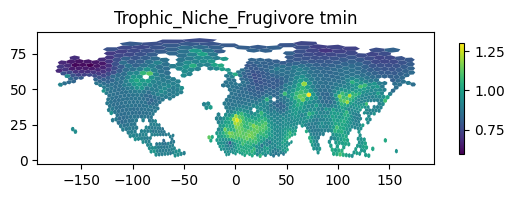

  0%|          | 0/5 [00:00<?, ?it/s]

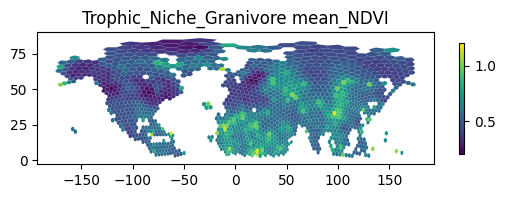

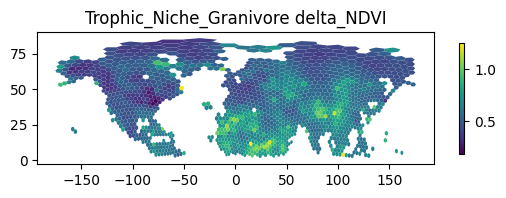

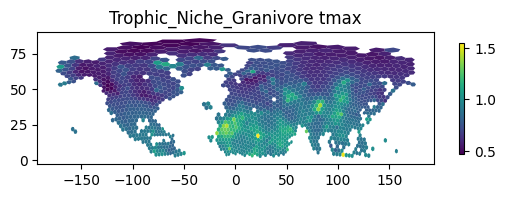

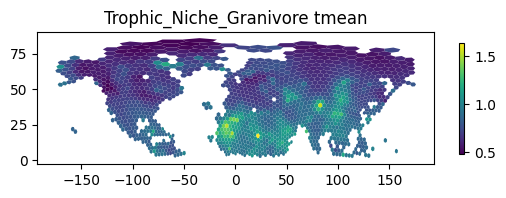

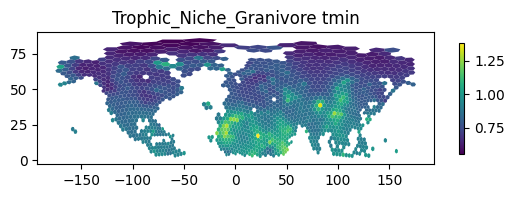

  0%|          | 0/5 [00:00<?, ?it/s]

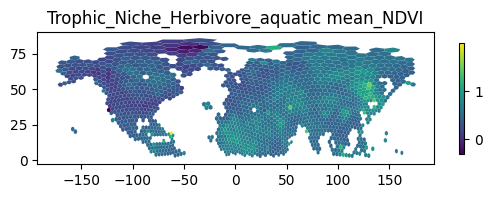

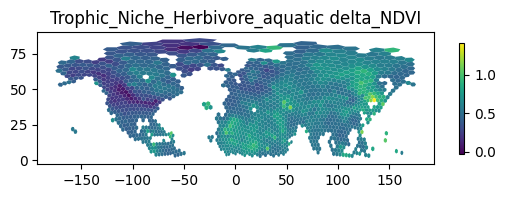

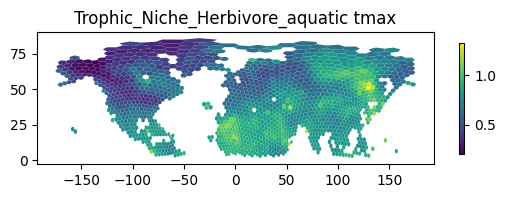

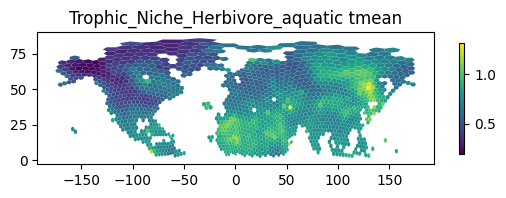

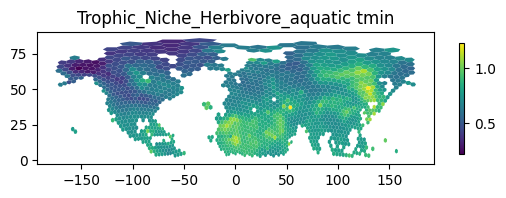

  0%|          | 0/5 [00:00<?, ?it/s]

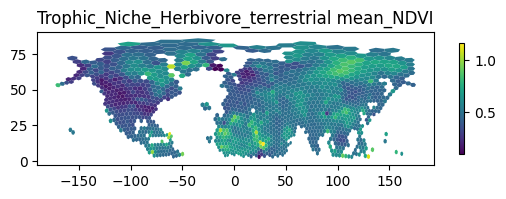

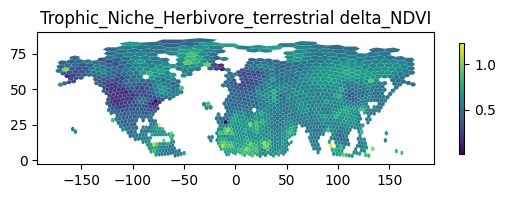

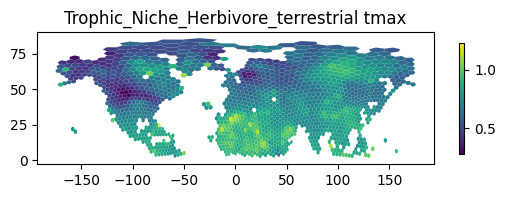

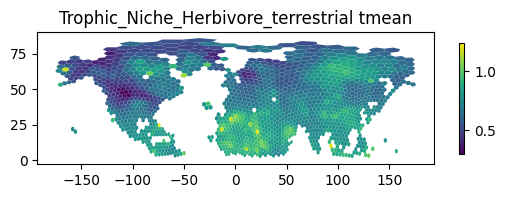

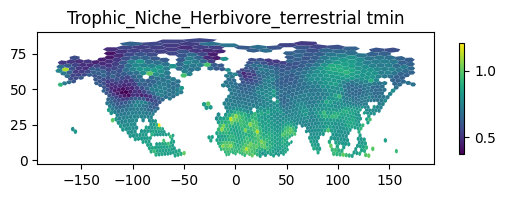

  0%|          | 0/5 [00:00<?, ?it/s]

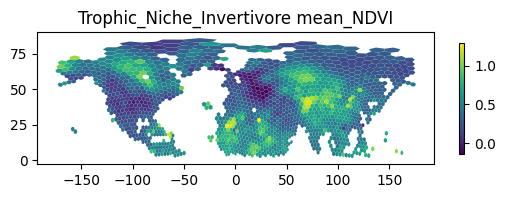

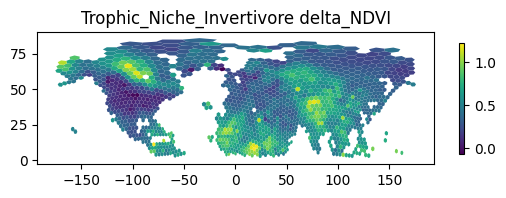

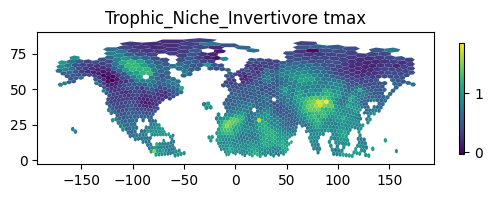

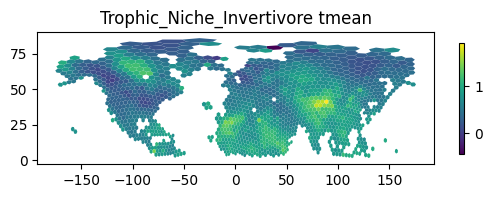

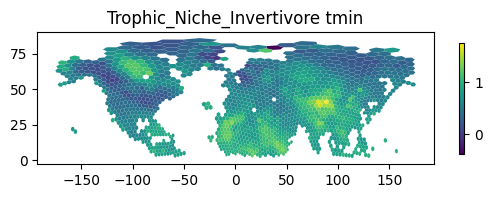

  0%|          | 0/5 [00:00<?, ?it/s]

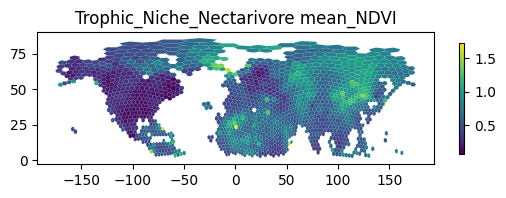

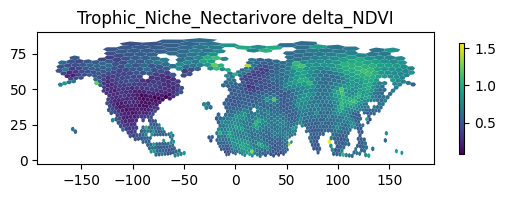

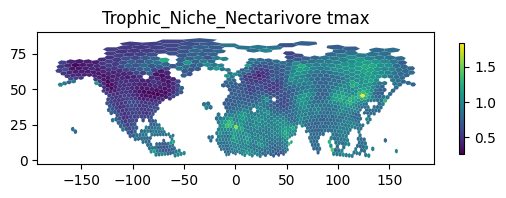

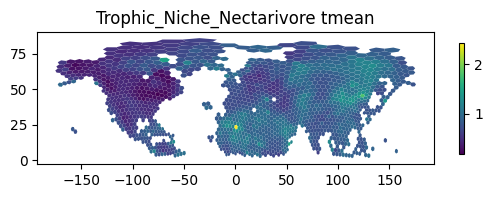

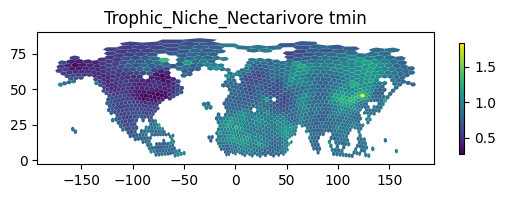

  0%|          | 0/5 [00:00<?, ?it/s]

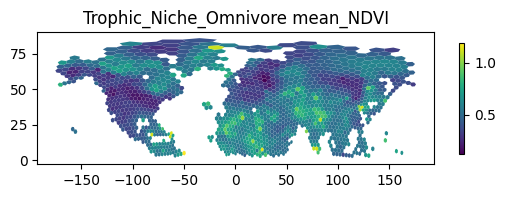

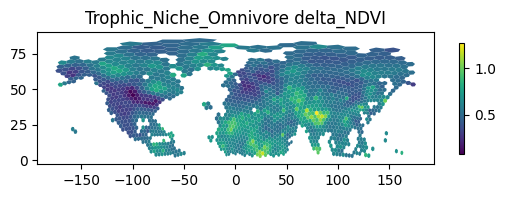

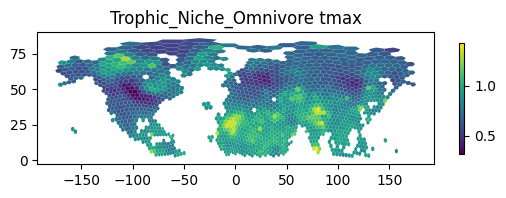

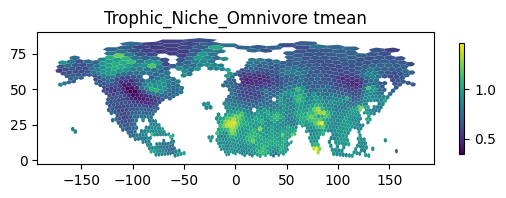

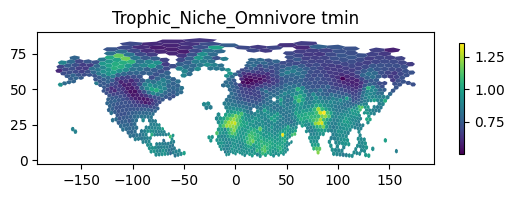

  0%|          | 0/5 [00:00<?, ?it/s]

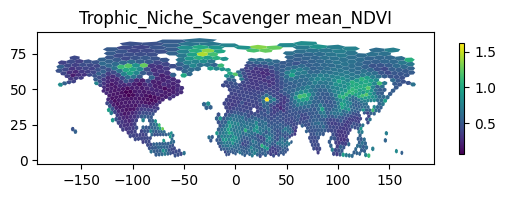

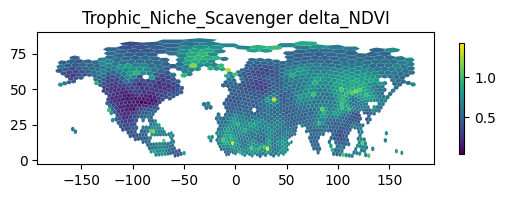

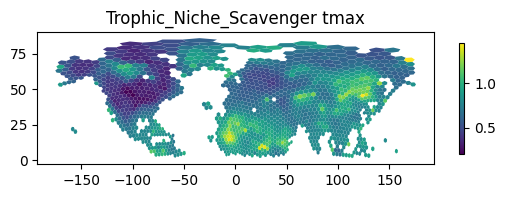

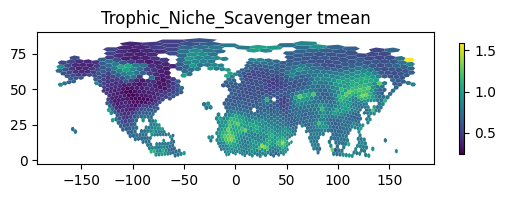

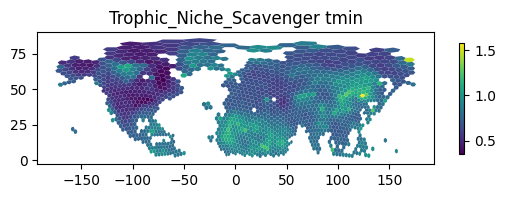

  0%|          | 0/5 [00:00<?, ?it/s]

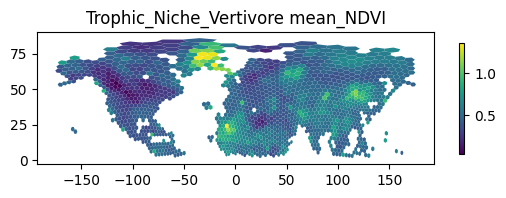

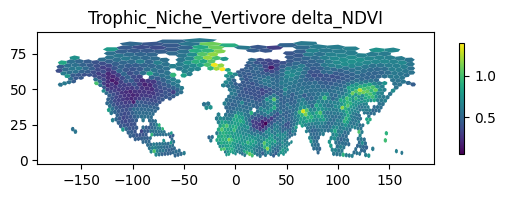

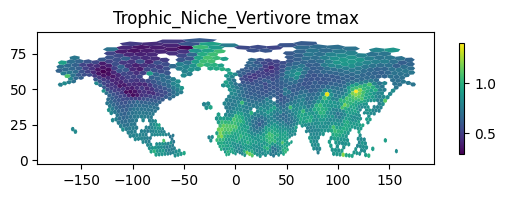

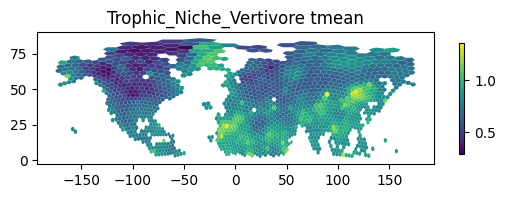

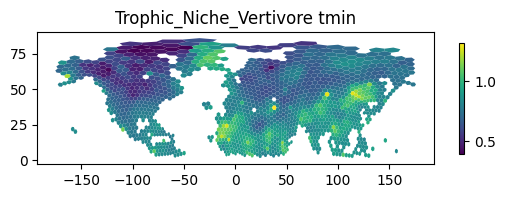

  0%|          | 0/5 [00:00<?, ?it/s]

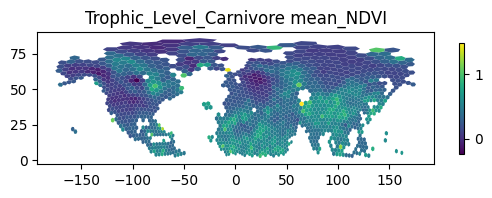

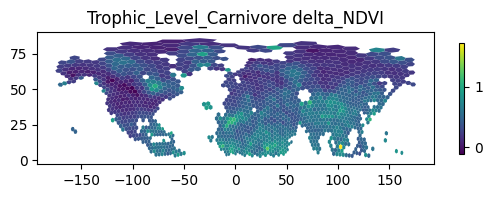

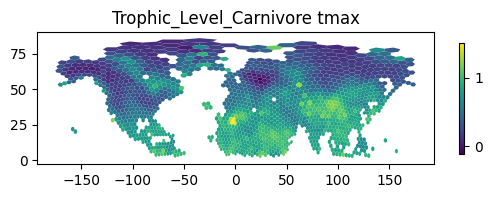

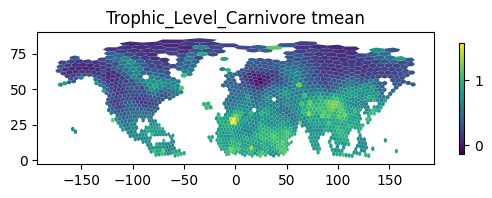

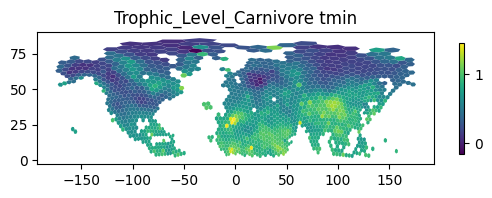

  0%|          | 0/5 [00:00<?, ?it/s]

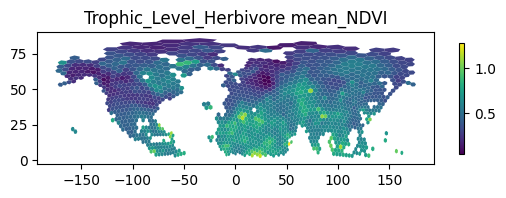

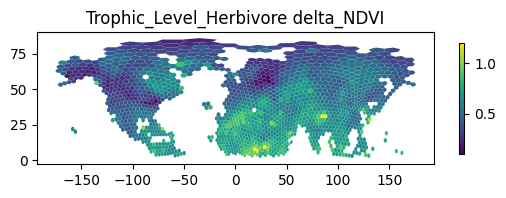

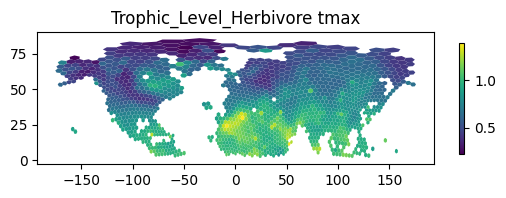

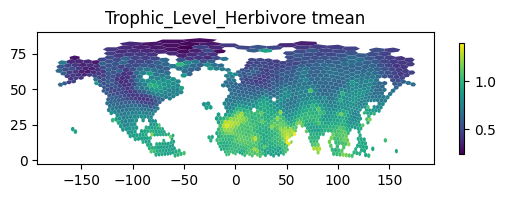

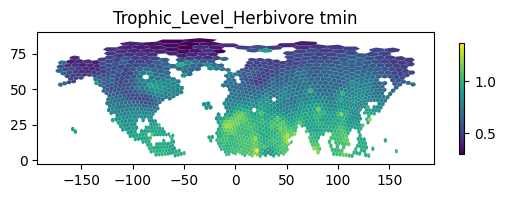

  0%|          | 0/5 [00:00<?, ?it/s]

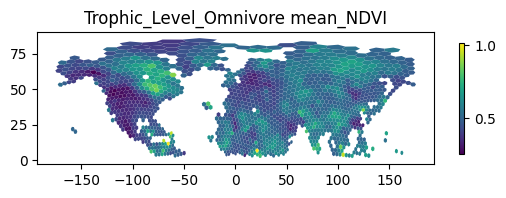

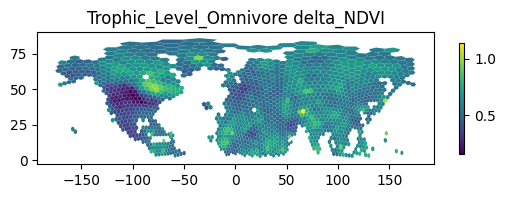

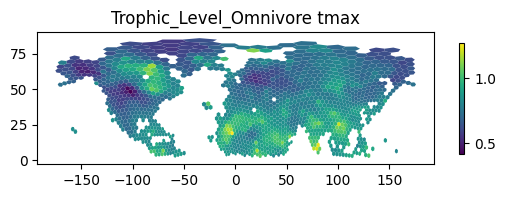

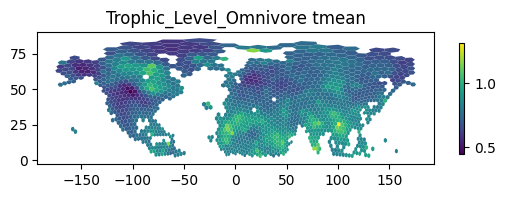

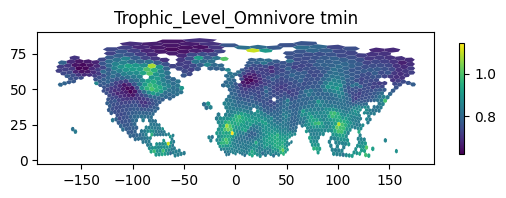

  0%|          | 0/5 [00:00<?, ?it/s]

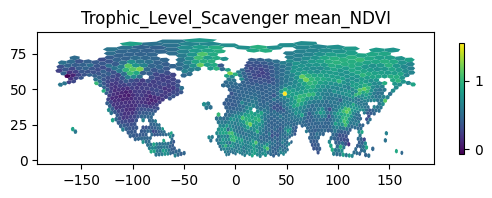

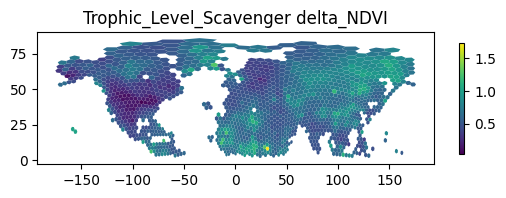

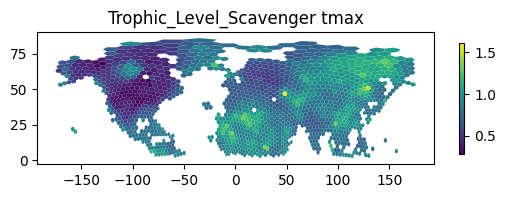

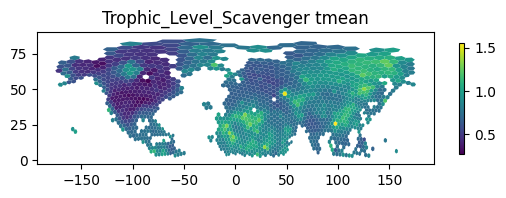

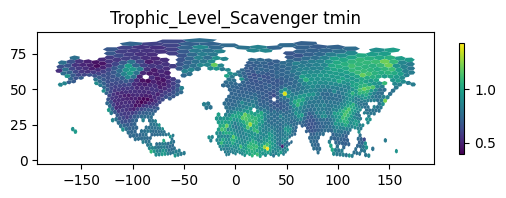

In [6]:
for niche in niche_list:

    for var_ in tqdm(['mean_NDVI','delta_NDVI','tmax','tmean','tmin']):
        
        sub_data = beta_geographic_summary[
            (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']==var_)
        ]
        
        if len(sub_data)==0:
            continue
        
        sub_data = sub_data.set_index('h3_02').h3.h3_to_geo_boundary()
        sub_data.plot('beta_mean', legend=True,legend_kwds={'shrink':0.3})
        plt.title(f'{niche} {var_}')
        plt.show()
        
        

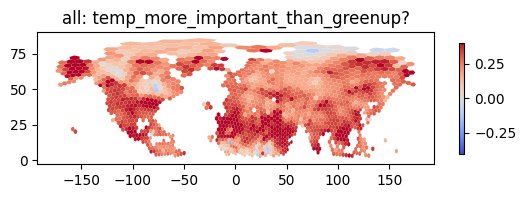

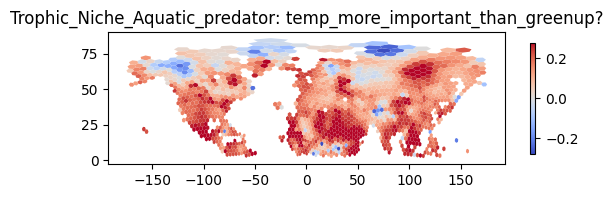

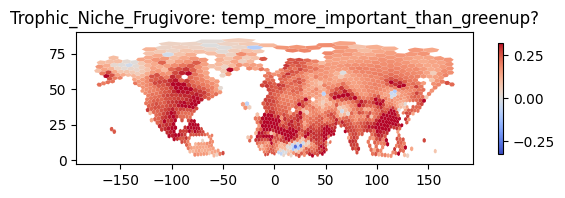

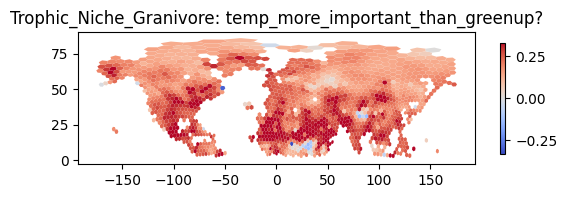

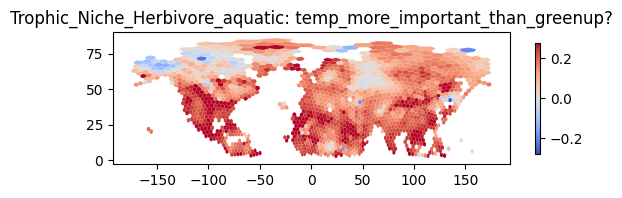

...

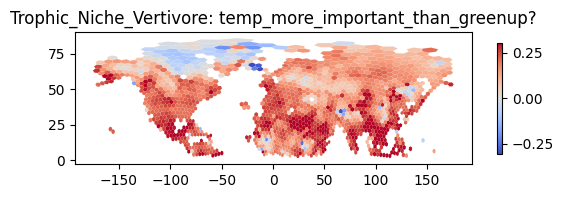

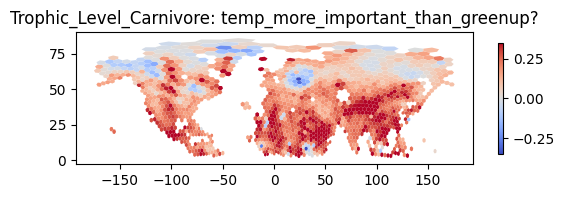

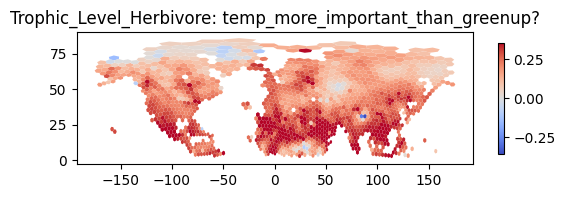

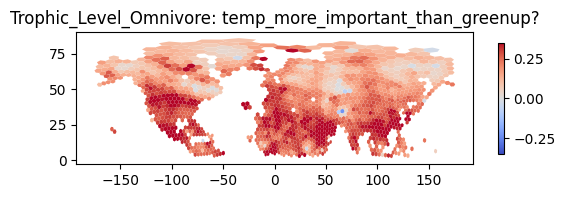

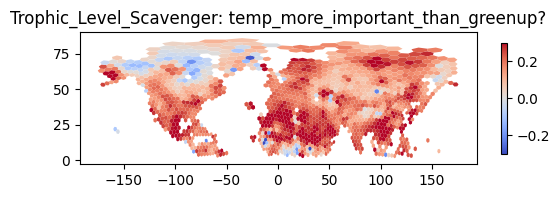

In [25]:
for niche in niche_list:


    sub_data1 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='delta_NDVI')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    sub_data2 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='tmean')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    tmp = pd.concat([
        sub_data1[['beta_mean','geometry']].rename(columns={'beta_mean':'beta_mean_delta_NDVI'}),
        sub_data2[['beta_mean']].rename(columns={'beta_mean':'beta_mean_tmean'})
    ],axis=1)

    tmp['temp_more_important_than_greenup'] =  tmp['beta_mean_tmean'] - tmp['beta_mean_delta_NDVI']
    half = tmp['temp_more_important_than_greenup'].abs().quantile(0.9)
    tmp.plot('temp_more_important_than_greenup', cmap='coolwarm', vmin=-half, vmax=half,legend=True,legend_kwds={'shrink':0.3})

    plt.title(f'{niche}: temp_more_important_than_greenup?')
    plt.show()
    
    

<Axes: >

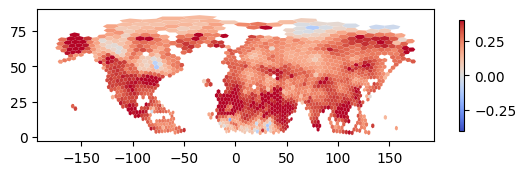

In [5]:
niche = 'all'

sub_data1 = beta_geographic_summary[
    (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='delta_NDVI')
].set_index('h3_02').h3.h3_to_geo_boundary()

sub_data2 = beta_geographic_summary[
    (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='tmean')
].set_index('h3_02').h3.h3_to_geo_boundary()

tmp = pd.concat([
    sub_data1[['beta_mean','geometry']].rename(columns={'beta_mean':'beta_mean_delta_NDVI'}),
    sub_data2[['beta_mean']].rename(columns={'beta_mean':'beta_mean_tmean'})
],axis=1)

tmp['temp_more_important_than_greenup'] =  tmp['beta_mean_tmean'] - tmp['beta_mean_delta_NDVI']
half = tmp['temp_more_important_than_greenup'].abs().quantile(0.9)
tmp.plot('temp_more_important_than_greenup', cmap='coolwarm', vmin=-half, vmax=half,legend=True,legend_kwds={'shrink':0.3})


  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:  00:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


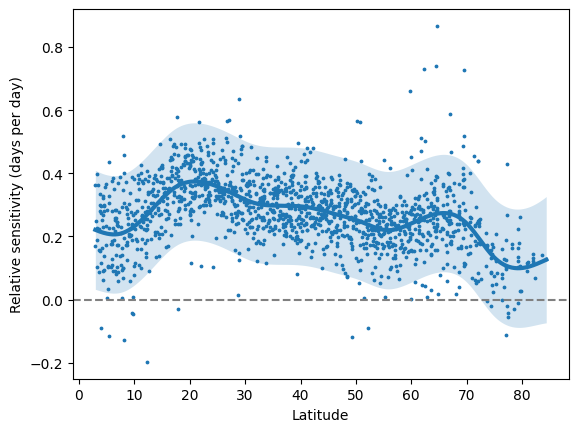

In [36]:
tmp['lat'] = tmp.centroid.y
tmp['lng'] = tmp.centroid.y
tmp = tmp.dropna()
from pygam import LinearGAM,s,f

model = LinearGAM(s(0)).gridsearch(tmp[['lat']].values, tmp['temp_more_important_than_greenup'].values)

XX = model.generate_X_grid(term=0, n=500)
pred = model.predict(XX)
CI = model.prediction_intervals(XX, width=.95)

plt.scatter(tmp['lat'], tmp['temp_more_important_than_greenup'],s=3)
plt.plot(XX, pred,color='tab:blue',linewidth=3)
plt.fill_between(XX.flatten(), CI[:,0], CI[:,1],alpha=0.2,color='tab:blue',edgecolor="b", linewidth=0.0)
ax = plt.gca()
ax.axhline(linestyle='dashed', color='grey')
plt.xlabel('Latitude')
plt.ylabel('Relative sensitivity (days per day)')
plt.show()


In [54]:
greenwave_data = pd.read_csv('../../data/D04.environmental_data/GreenWave_agg_h3_02_2020.csv')
resource_variability = greenwave_data.groupby('h3_02')[['mean_NDVI']].std().h3.h3_to_geo_boundary().reset_index(drop=False)
resource_variability = resource_variability.rename(columns={'mean_NDVI':'resource_variability'})

new_tmp = pd.concat([tmp, resource_variability[['h3_02','resource_variability']].set_index('h3_02')],axis=1)
new_tmp = new_tmp.dropna()



In [55]:
import statsmodels.api as sm

X = new_tmp[['lat','resource_variability']]
X['lat'] = (X['lat'] - X['lat'].mean()) / X['lat'].std()
# X['env_date_mean_std'] = (X['env_date_mean_std'] - X['env_date_mean_std'].mean()) / X['env_date_mean_std'].std()
X['resource_variability'] = (X['resource_variability'] - X['resource_variability'].mean()) / X['resource_variability'].std()
X = sm.add_constant(X)

y = new_tmp['temp_more_important_than_greenup']

model = sm.OLS(y, X).fit()
model = model.get_robustcov_results()
model.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                   
============================================================================================
Dep. Variable:     temp_more_important_than_greenup   R-squared:                       0.081
Model:                                          OLS   Adj. R-squared:                  0.079
Method:                               Least Squares   F-statistic:                     52.40
Date:                              Mon, 08 Jul 2024   Prob (F-statistic):           1.02e-22
Time:                                      10:44:08   Log-Likelihood:                 1229.8
No. Observations:                              1494   AIC:                            -2454.
Df Residuals:                                  1491   BIC:                            -2438.
Df Model:                                         2                                         
Covariance Type:                                HC1                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2750      0.003     99.945      0.000       0.270       0.280
lat                     -0.0172      0.004     -3.965      0.000      -0.026      -0.009
resource_variability    -0.0183      0.004     -4.651      0.000      -0.026      -0.011
==============================================================================
Omnibus:                      104.744   Durbin-Watson:                   0.883
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              502.725
Skew:                           0.005   Prob(JB):                    6.83e-110
Kurtosis:                       5.842   Cond. No.                         1.91
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

In [30]:
reg_data = []
for niche in niche_list:

    sub_data1 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='delta_NDVI')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    sub_data2 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='tmean')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    tmp = pd.concat([
        sub_data1[['beta_mean','geometry','lat','lng']].rename(columns={'beta_mean':'beta_mean_delta_NDVI'}),
        sub_data2[['beta_mean']].rename(columns={'beta_mean':'beta_mean_tmean'})
    ],axis=1)

    tmp['temp_more_important_than_greenup'] =  tmp['beta_mean_tmean'] - tmp['beta_mean_delta_NDVI']
    # half = tmp['temp_more_important_than_greenup'].abs().quantile(0.9)
    # tmp.plot('temp_more_important_than_greenup', cmap='coolwarm', vmin=-half, vmax=half,legend=True,legend_kwds={'shrink':0.3})
    # plt.scatter(tmp['lat'],tmp['temp_more_important_than_greenup'])
    # plt.title(f'{niche}: temp_more_important_than_greenup?')
    # plt.show()
    tmp['niche'] = niche
    reg_data.append(tmp.reset_index(drop=False))
    
reg_data = pd.concat(reg_data, axis=0).reset_index(drop=True)
reg_data = reg_data[reg_data['niche'].isin([i for i in niche_list if i.startswith('Trophic_Niche')])]


0.3164790051032178

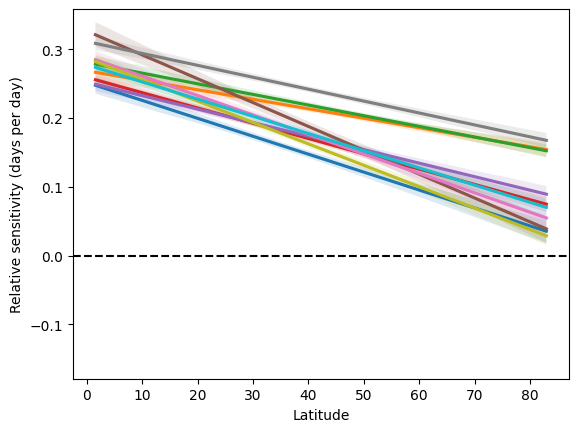

In [60]:
# import matplotlib
# cmap = matplotlib.cm.get_cmap('tab10')
# cmap.colors
fig,ax = plt.subplots()
for niche in reg_data.niche.unique():
    sns.regplot(reg_data[reg_data['niche']==niche], x='lat', y='temp_more_important_than_greenup',
                # ci=None,
                scatter=False,ax=ax)
    
half = reg_data['temp_more_important_than_greenup'].quantile(0.95).max()
ax.set_ylim(-half/2,half)
ax.set_ylabel('Relative sensitivity (days per day)')
ax.set_xlabel('Latitude')
ax.axhline(0,linestyle='dashed',c='black')
plt.show()


In [42]:
?sns.regplot


Signature:
sns.regplot(
    data=None,
    *,
    x=None,
    y=None,
    x_estimator=None,
    x_bins=None,
    x_ci='ci',
    scatter=True,
    fit_reg=True,
    ci=95,
    n_boot=1000,
    units=None,
    seed=None,
    order=1,
    logistic=False,
    lowess=False,
    robust=False,
    logx=False,
    x_partial=None,
    y_partial=None,
    truncate=True,
    dropna=True,
    x_jitter=None,
    y_jitter=None,
    label=None,
    color=None,
    marker='o',
    scatter_kws=None,
    line_kws=None,
    ax=None,
)
Docstring:
Plot data and a linear regression model fit.

There are a number of mutually exclusive options for estimating the
regression model. See the :ref:`tutorial <regression_tutorial>` for more
information.    

Parameters
----------
x, y: string, series, or vector array
    Input variables. If strings, these should correspond with column names
    in ``data``. When pandas objects are used, axes will be labeled with
    the series name.
data : DataFrame
    Tidy ("long-

In [37]:
?sns.regplot

Signature:
sns.regplot(
    data=None,
    *,
    x=None,
    y=None,
    x_estimator=None,
    x_bins=None,
    x_ci='ci',
    scatter=True,
    fit_reg=True,
    ci=95,
    n_boot=1000,
    units=None,
    seed=None,
    order=1,
    logistic=False,
    lowess=False,
    robust=False,
    logx=False,
    x_partial=None,
    y_partial=None,
    truncate=True,
    dropna=True,
    x_jitter=None,
    y_jitter=None,
    label=None,
    color=None,
    marker='o',
    scatter_kws=None,
    line_kws=None,
    ax=None,
)
Docstring:
Plot data and a linear regression model fit.

There are a number of mutually exclusive options for estimating the
regression model. See the :ref:`tutorial <regression_tutorial>` for more
information.    

Parameters
----------
x, y: string, series, or vector array
    Input variables. If strings, these should correspond with column names
    in ``data``. When pandas objects are used, axes will be labeled with
    the series name.
data : DataFrame
    Tidy ("long-

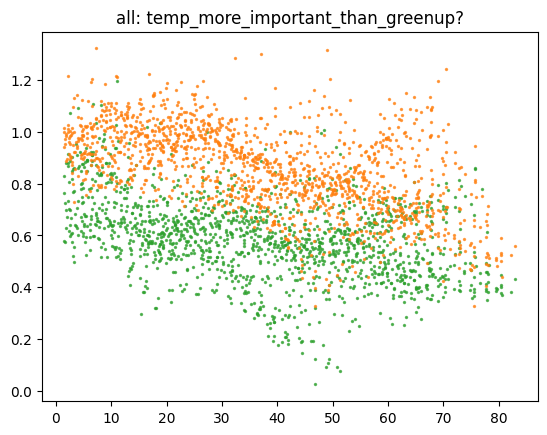

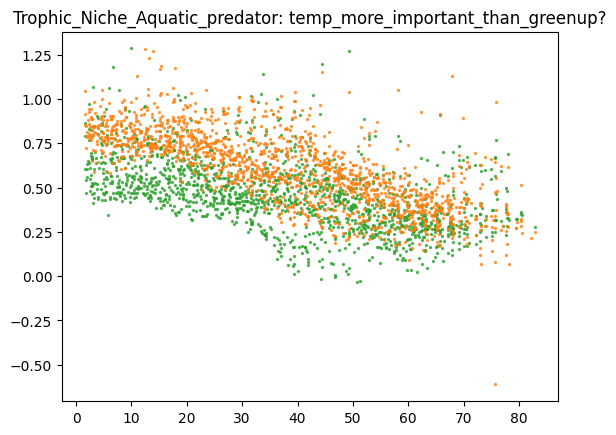

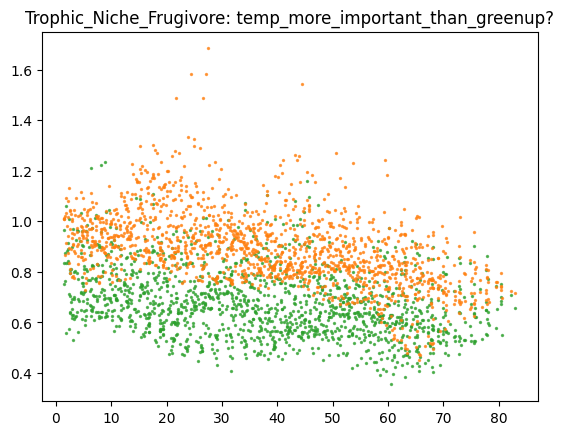

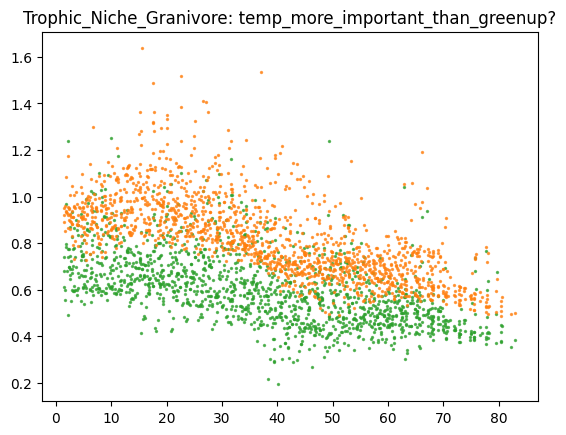

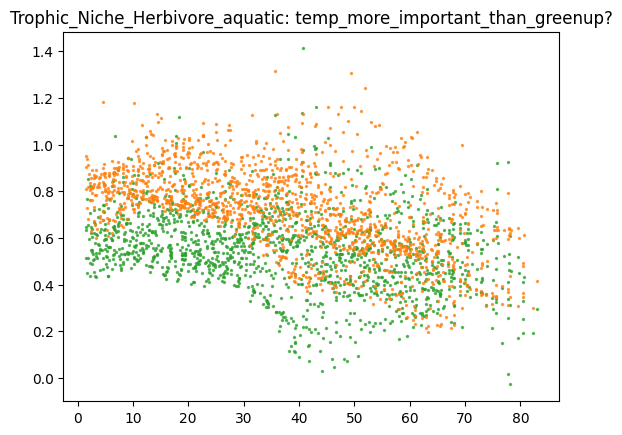

...

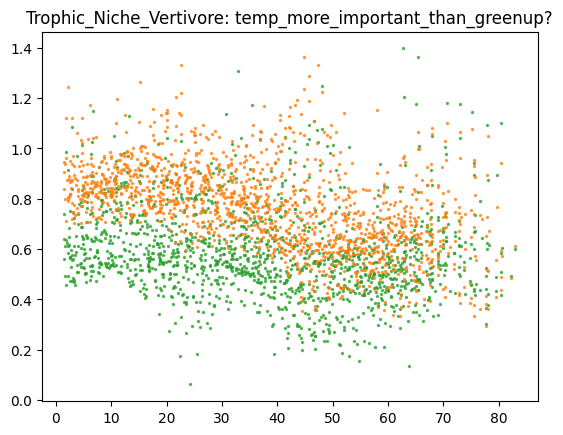

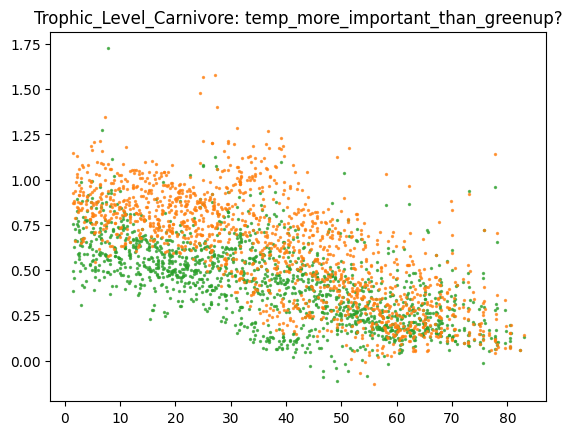

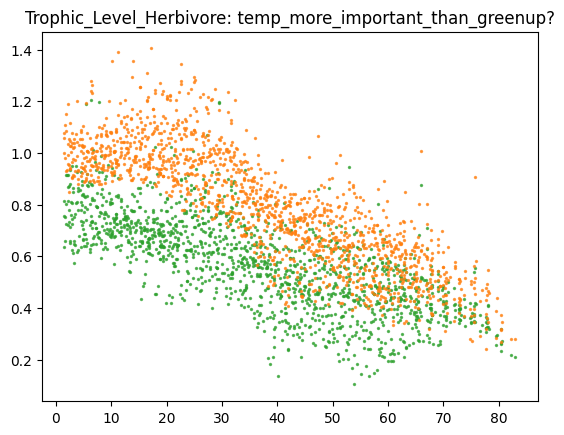

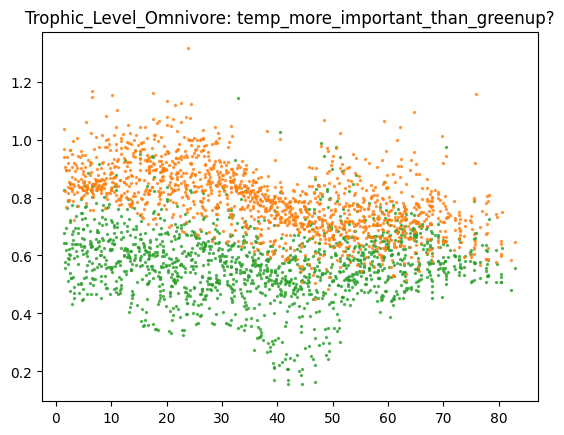

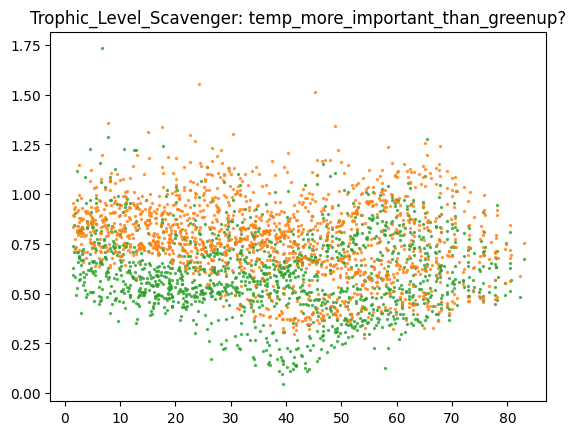

In [24]:

for niche in niche_list:


    sub_data1 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='delta_NDVI')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    sub_data2 = beta_geographic_summary[
        (beta_geographic_summary['niche']==niche) & (beta_geographic_summary['env_var']=='tmean')
    ].set_index('h3_02').h3.h3_to_geo_boundary()
    
    tmp = pd.concat([
        sub_data1[['beta_mean','geometry','lng','lat']].rename(columns={'beta_mean':'beta_mean_delta_NDVI'}),
        sub_data2[['beta_mean']].rename(columns={'beta_mean':'beta_mean_tmean'})
    ],axis=1)

    plt.scatter(tmp['lat'], tmp['beta_mean_delta_NDVI'], c='tab:green',s=2, alpha=0.7)
    plt.scatter(tmp['lat'], tmp['beta_mean_tmean'], c='tab:orange',s=2, alpha=0.7)
    
    # tmp['temp_more_important_than_greenup'] =  tmp['beta_mean_tmean'] - tmp['beta_mean_delta_NDVI']
    # half = tmp['temp_more_important_than_greenup'].abs().quantile(0.9)
    # tmp.plot('temp_more_important_than_greenup', cmap='coolwarm', vmin=-half, vmax=half,legend=True,legend_kwds={'shrink':0.3})

    plt.title(f'{niche}: temp_more_important_than_greenup?')
    plt.show()
    
    